In [238]:
import os
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Creating Base JSON File to Store Parameters

In [239]:
parameters_file = "2022028_parameters.json"

if not os.path.exists(parameters_file):
    data = {
        "intrinsic_parameters": {
            "focal_length": [0.0, 0.0],
            "skew": 0.0,
            "principal_point": [0.0, 0.0]
        },
        "extrinsic_parameters": [
            {
                "image_id": 1,
                "rotation_matrix": [[0.0, 0.0, 0.0] for _ in range(3)],
                "translation_vector": [0.0, 0.0, 0.0]
            },
            {
                "image_id": 2,
                "rotation_matrix": [[0.0, 0.0, 0.0] for _ in range(3)],
                "translation_vector": [0.0, 0.0, 0.0]
            }
        ],
        "radial_distortion_coefficients": [0.0, 0.0, 0.0],
        "reprojection_errors": {
            "mean_error": 0.0,
            "std_dev": 0.0
        }
    }

    with open(parameters_file, 'w') as f:
        json.dump(data, f, indent=4)
    print(f"Created file: {parameters_file}")
else:
    print(f"File already exists: {parameters_file}")


File already exists: 2022028_parameters.json


## Preprocessing Image Data to get Checker Points
### Resource: https://www.youtube.com/watch?v=EWqqseIjVqM

In [240]:
def get_points(images, image_paths, CHECKERBOARD):
    CHECKERBOARD = (6, 8)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 1e-3)

    objpoints, imgpoints = [], []

    objp = np.zeros((CHECKERBOARD[0] * CHECKERBOARD[1], 3), np.float32)
    objp[:, :2] = np.indices((CHECKERBOARD[0], CHECKERBOARD[1])).T.reshape(-1, 2)

    for idx, image in enumerate(images):
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, flags=cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK + cv2.CALIB_CB_NORMALIZE_IMAGE)
        if ret:
            objpoints.append(objp)
            corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
            imgpoints.append(corners2)
            cv2.drawChessboardCorners(image, CHECKERBOARD, corners2, ret)
        else:
            raise ValueError(f"Chessboard corners not found in image: {image_paths[idx]}")
    
    return objpoints, imgpoints

## Intrinsic Coefficients

In [241]:
def get_intrinsic(mtx, save= False):
    fx = mtx[0, 0]
    fy = mtx[1, 1]
    skew = mtx[0, 1]
    cx = mtx[0, 2]
    cy = mtx[1, 2]


    intrinsic = {
        "focal_length": [fx, fy],
        "skew": skew,
        "principal_point": [cx, cy]
    }

    if save:
        with open(parameters_file, 'r') as f:
            data = json.load(f)

        data["intrinsic_parameters"] = intrinsic
        
        with open(parameters_file, 'w') as f:
            json.dump(data, f, indent=4)

        print("Intrinsic parameters updated in JSON.")

    return intrinsic


## Extrinsic Coefficients

In [242]:
def get_extrinsic(image_paths, rvecs, tvecs, indices=range(2), save=False):
    extrinsics = []
    for i in indices:
        R = cv2.Rodrigues(rvecs[i])[0]
        t = tvecs[i].flatten().tolist()

        extrinsics.append({
            "image_id": image_paths[i].split('\\')[-1],
            "rotation_matrix": R.tolist(),
            "translation_vector": t
        })

    if save:
        with open(parameters_file, 'r') as f:
            data = json.load(f)

        data["extrinsic_parameters"] = extrinsics

        with open(parameters_file, 'w') as f:
            json.dump(data, f, indent=4)

        print("Extrinsic parameters for first 2 images added.")

    return extrinsics

## Radial Distortion Coefficients

In [243]:
def get_radial_distortion(dist, save=False):
    k1, k2, _, _, k3 = dist.ravel()
    radial_coeffs = [k1, k2, k3]

    if save:
        with open(parameters_file, 'r') as f:
            data = json.load(f)

        data["radial_distortion_coefficients"] = radial_coeffs
        with open(parameters_file, 'w') as f:
            json.dump(data, f, indent=4)

        print("Radial distortion coefficients saved.")

    return radial_coeffs

## Undistorting Images using Distortion Coefficients
### Resource: https://www.youtube.com/watch?v=H5qbRTikxI4

In [244]:
def display_undistorted_images(image_paths, mtx, dist, indices= range(5), threshold=0.8):
    for idx in indices:
        distorted_img = cv2.cvtColor(cv2.imread(image_paths[idx]), cv2.COLOR_BGR2RGB)
        height, width = distorted_img.shape[:2]
        new_camera_matrix, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (width, height), threshold, (width, height))
        undistorted_img = cv2.undistort(distorted_img, mtx, dist, None, new_camera_matrix)
        x, y, w, h = roi
        undistorted_img = undistorted_img[y:y+h, x:x+w]

        # Create a new figure for each pair
        plt.figure(figsize=(8, 4))

        # Original image (Left)
        plt.subplot(1, 2, 1)
        plt.imshow(distorted_img)
        plt.title(f"Original: {image_paths[idx].split('\\')[-1]}")
        plt.axis("off")

        # Undistorted image (Right)
        plt.subplot(1, 2, 2)
        plt.imshow(undistorted_img)
        plt.title(f"Undistorted: {image_paths[idx].split('\\')[-1]}")
        plt.axis("off")

        # Show the figure
        plt.show()

## Reprojection Error
### Resource: https://www.youtube.com/watch?v=3h7wgR5fYik

In [245]:
def get_errors(image_paths, objpoints, imgpoints, rvecs, tvecs, mtx, dist, plot=True):
    errors, corners, projections = [], [], []
    for i in range(len(image_paths)):
        projected_points, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
        error = cv2.norm(imgpoints[i], projected_points, cv2.NORM_L2) / len(projected_points)
        errors.append(error)

        corners.append(imgpoints[i].reshape(-1, 2))
        projected_points = projected_points.reshape(-1, 2)
        projections.append(projected_points)

    if plot:
        plt.figure(figsize=(12, 5))

        plt.bar(range(len(errors)), errors)
        plt.title("Reprojection Error Per Image")
        plt.xlabel("Image")
        plt.ylabel("Reprojection Error")
        plt.xticks(range(len(errors)), [image.split("\\")[-1] for image in image_paths], rotation='vertical')

        plt.grid(True, axis = 'y')
        plt.show()

    return errors, corners, projections

## Scatter Plot to Display Original and Reprojected Corners

In [246]:
def plot_points(image_paths, images, points, color):
    plt.figure(figsize=(13, 16))

    for i, image in enumerate(images):
        plt.subplot(5, 5, i+1)
        plt.imshow(image)
        plt.scatter(points[i][:, 0], points[i][:, 1], s=5, color=color)
        plt.title(image_paths[i].split('\\')[-1], fontsize=8)
        plt.axis("off")

    plt.show()

## Obtaining Plane Normals and Visualizing Pose

In [247]:
def get_normals(image_paths, images, objpoints, corners, rvecs, tvecs, mtx, dist):
    normals = []
    length = 3
    plt.figure(figsize=(13, 16))
    for i in range(len(image_paths)):
        R = cv2.Rodrigues(rvecs[i])[0]
        normal = R[:, 2]
        normal /= np.linalg.norm(normal)
        normals.append(normal)
        axis_1 = np.array([corners[i][0], corners[i][47]])
        axis_2 = np.array([corners[i][5], corners[i][42]])

        centroid = np.mean(objpoints[i], axis=0)
        normal = cv2.Rodrigues(rvecs[i])[0][:, 2]
        (x0, y0), (x1, y1) = cv2.projectPoints(np.array([centroid, centroid - length*normal]), rvecs[i], tvecs[i], mtx, dist)[0].reshape(-1, 2)
        
        plt.subplot(5, 5, i+1)
        plt.imshow(images[i])
        plt.plot(axis_1[:, 0], axis_1[:, 1], color="blue", linewidth=2)
        plt.plot(axis_2[:, 0], axis_2[:, 1], color="blue", linewidth=2)
        plt.plot([x0, x1], [y0, y1], color="red", linewidth=2)
        plt.title(image_paths[i].split('\\')[-1], fontsize=8)
        plt.axis("off")
    plt.show()
    return normals

## Chessboard Dataset: Given
### Link: https://drive.google.com/drive/folders/1ADHmjLLwymPaCNxtVD12V9lLALQP4asI

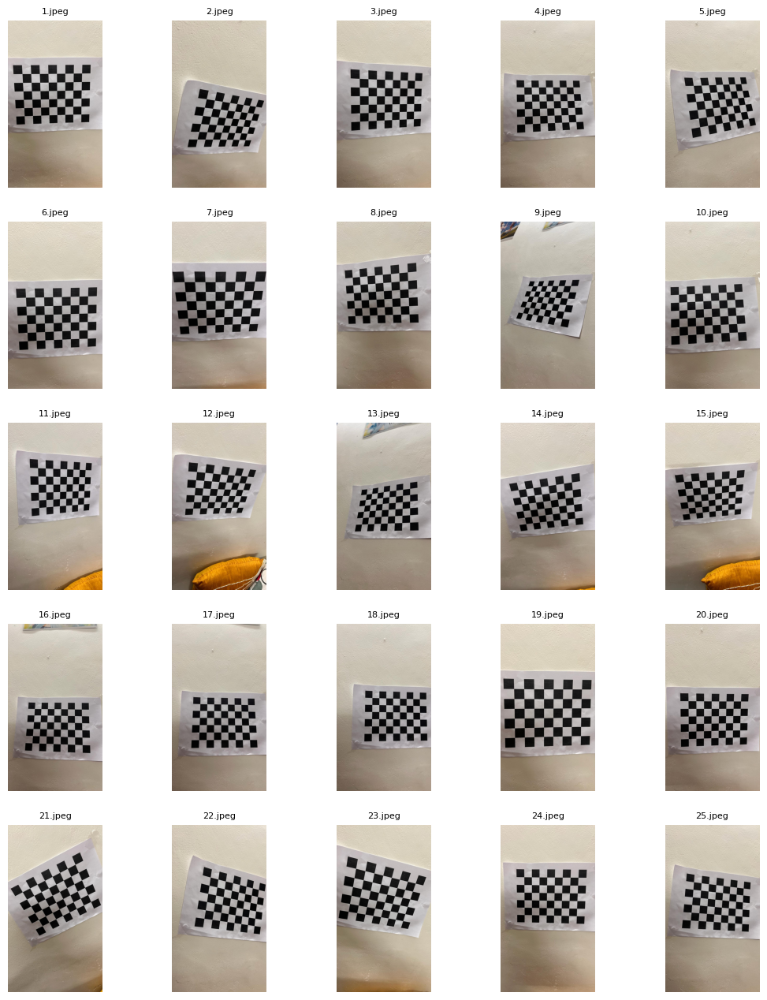

In [248]:
image_paths = [os.path.join('chessboard_dataset', f'{idx}.jpeg') for idx in range(1, 26)]
images = [cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB) for img_path in image_paths]

plt.figure(figsize=(13, 16))

for i in range(len(images)):
    plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(image_paths[i].split('\\')[-1], fontsize=8)
    plt.axis("off")

plt.show()

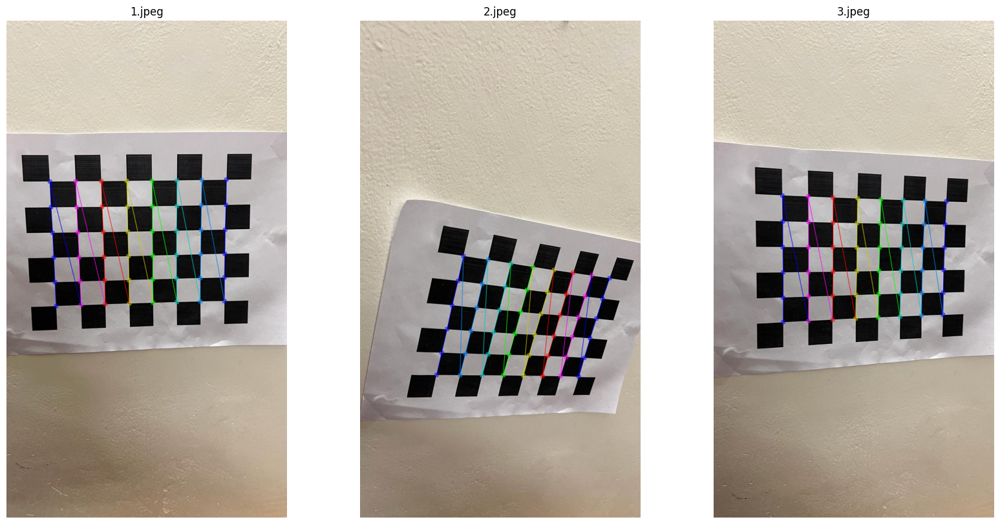

In [249]:
objpoints, imgpoints = get_points(images, image_paths, CHECKERBOARD=(6,8))
h, w = images[0].shape[:2]

plt.figure(figsize=(20, 10))
for idx in range(3):
    plt.subplot(1, 3, idx + 1)
    plt.title(image_paths[idx].split("\\")[-1])
    plt.imshow(images[idx])
    plt.axis("off")
plt.show()

In [250]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (w, h), None, None)
assert ret, "Calibration failed"
print("CAMERA MATRIX:\n", mtx)

CAMERA MATRIX:
 [[956.64224006   0.         369.02320992]
 [  0.         957.55993538 651.41147149]
 [  0.           0.           1.        ]]


In [251]:
get_intrinsic(mtx, save=True)

Intrinsic parameters updated in JSON.


{'focal_length': [956.6422400596589, 957.5599353826644],
 'skew': 0.0,
 'principal_point': [369.0232099213968, 651.4114714908994]}

In [252]:
get_extrinsic(image_paths, rvecs, tvecs, save=True)

Extrinsic parameters for first 2 images added.


[{'image_id': '1.jpeg',
  'rotation_matrix': [[0.013871573976875209,
    -0.9970004266867422,
    -0.07614281727030023],
   [0.9885615437433356, 0.025111636003789333, -0.1487127431291831],
   [0.15017873906514623, -0.0732089811680742, 0.9859446188347172]],
  'translation_vector': [3.0411995933966915,
   -3.7929121167838735,
   15.171692040709857]},
 {'image_id': '2.jpeg',
  'rotation_matrix': [[0.2419429839445728,
    0.8905346282603145,
    -0.3852423502021286],
   [-0.9430765413866279, 0.1224538922043366, -0.30921138622347766],
   [-0.2281890216601845, 0.4381245486768255, 0.869469177280308]],
  'translation_vector': [-2.7069553381468427,
   4.0575120305983345,
   15.059177873803659]}]

In [253]:
get_radial_distortion(dist, save=True)

Radial distortion coefficients saved.


[0.19742550220623545, -0.7053337245225078, 0.04759644265609909]

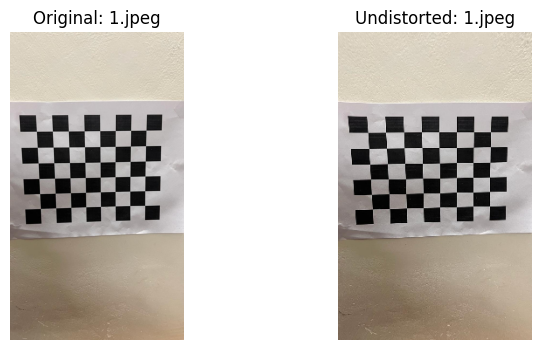

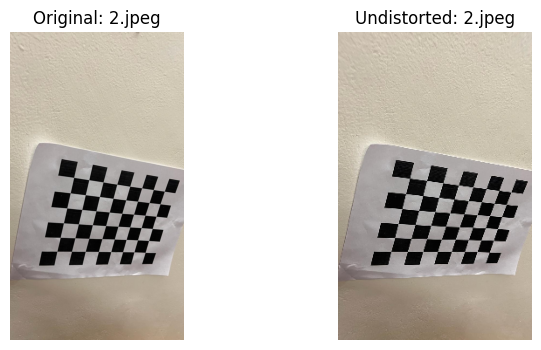

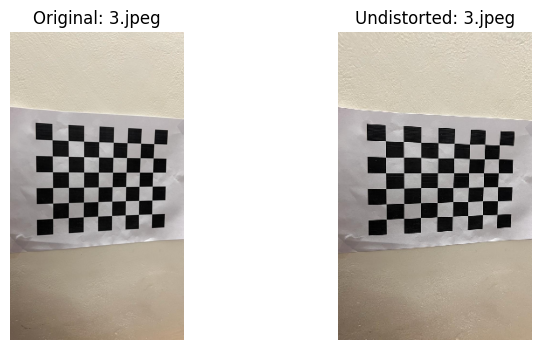

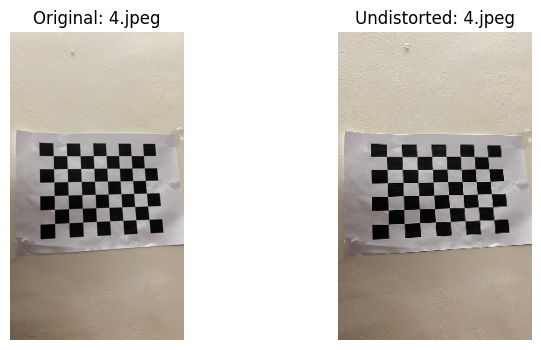

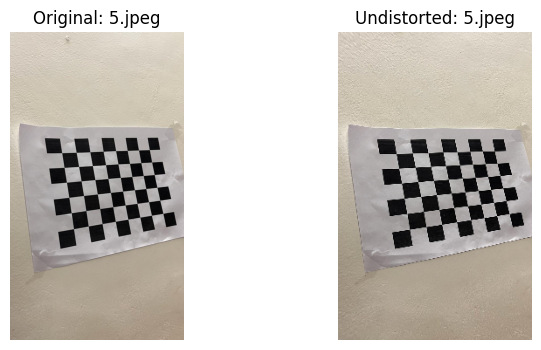

In [254]:
display_undistorted_images(image_paths, mtx, dist)

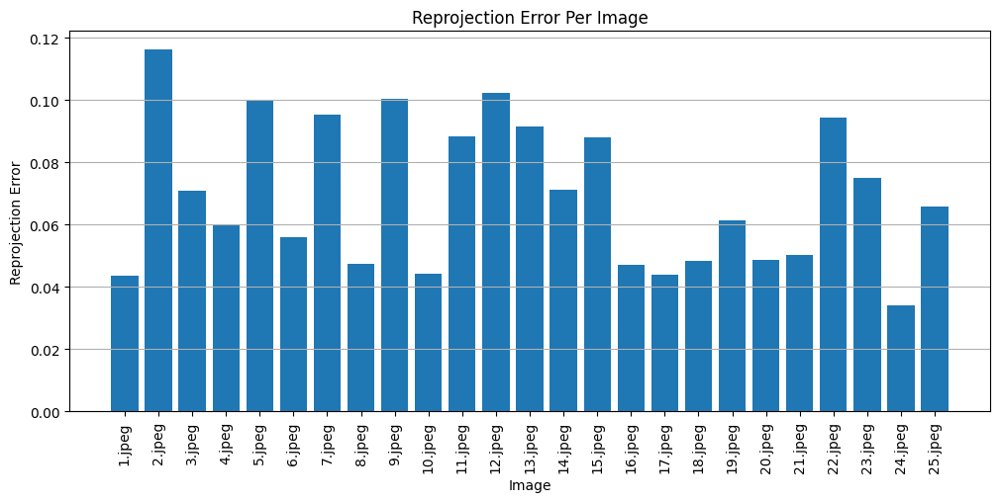

Mean Reprojection Error: 0.06971456911688327
Standard Deviation of Reprojection Error: 0.023215920420308844
Mean and Standard Deviation saved.


In [255]:
errors, corners, projections = get_errors(image_paths, objpoints, imgpoints, rvecs, tvecs, mtx, dist)
mean, std = np.mean(errors), np.std(errors)
print("Mean Reprojection Error:", mean)
print("Standard Deviation of Reprojection Error:", std)

with open(parameters_file, 'r') as f:
    data = json.load(f)

data["reprojection_errors"] = {"mean_error": mean, "std_dev": std}
with open(parameters_file, 'w') as f:
    json.dump(data, f, indent=4)

print("Mean and Standard Deviation saved.")


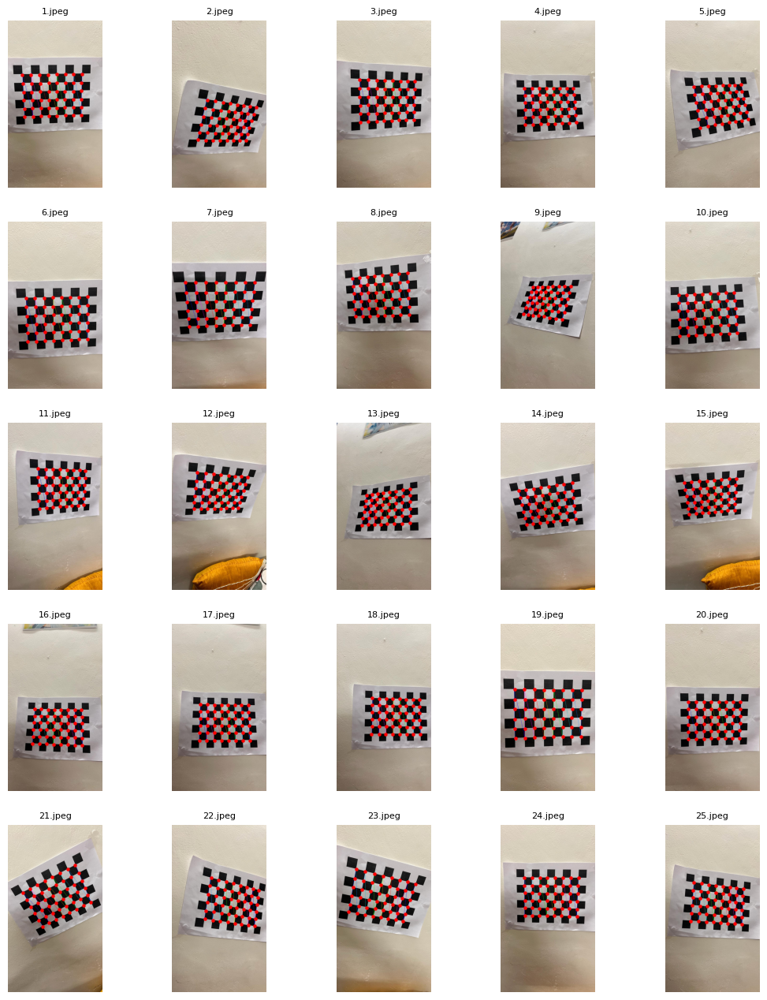

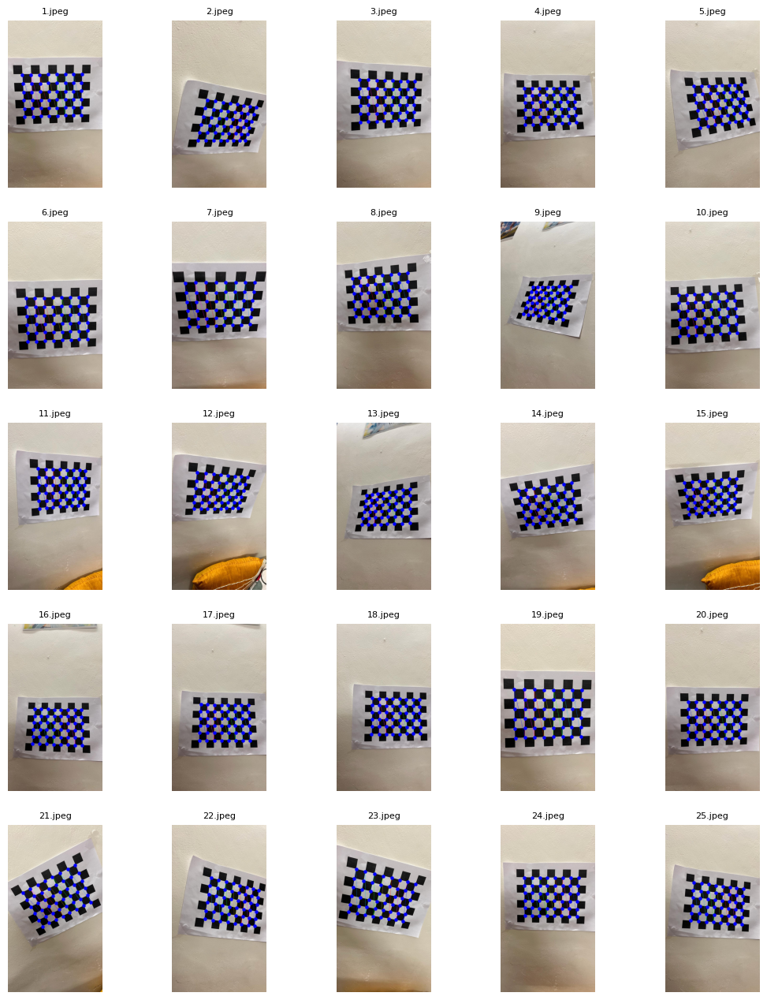

In [256]:
plot_points(image_paths, images, corners, 'red')
plot_points(image_paths, images, projections, 'blue')

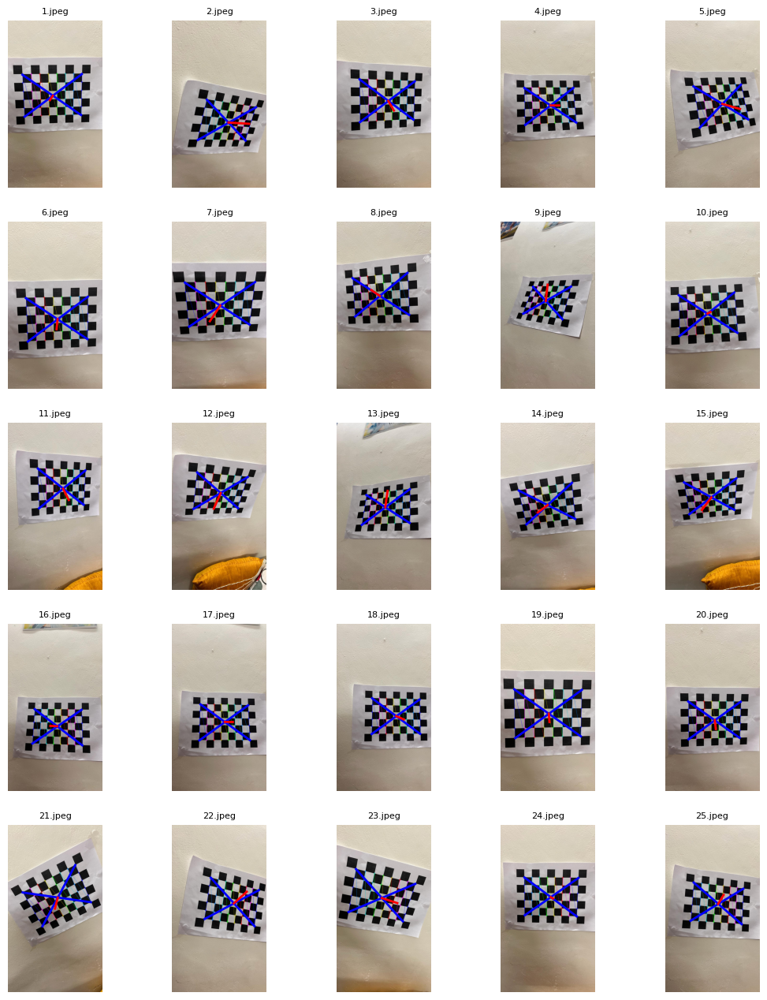

In [257]:
normals = get_normals(image_paths, images, objpoints, corners, rvecs, tvecs, mtx, dist)

In [258]:
print("Normals for Images:")
for i, image_path in enumerate(image_paths):
    print(f"{image_path.split('\\')[-1]}: {normals[i]}")

Normals for Images:
1.jpeg: [-0.07614282 -0.14871274  0.98594462]
2.jpeg: [-0.38524235 -0.30921139  0.86946918]
3.jpeg: [-0.27137069 -0.09614749  0.95766049]
4.jpeg: [-0.16579513  0.16015865  0.97306792]
5.jpeg: [-0.39733691  0.19080926  0.8976164 ]
6.jpeg: [-0.08323149 -0.12754391  0.98833449]
7.jpeg: [-0.1031108  -0.40167836  0.90995751]
8.jpeg: [ 0.18878635 -0.06637134  0.97977271]
9.jpeg: [0.45457849 0.40009209 0.79579188]
10.jpeg: [-0.0228767   0.12387258  0.9920344 ]
11.jpeg: [-0.39823935 -0.18715614  0.89798552]
12.jpeg: [-0.3464131  -0.52809983  0.77531189]
13.jpeg: [0.35821827 0.39862471 0.84426182]
14.jpeg: [ 0.04524897 -0.32517786  0.94456968]
15.jpeg: [-0.12777695 -0.50727314  0.85225994]
16.jpeg: [0.0720445  0.21725405 0.97345276]
17.jpeg: [-0.095371    0.19722026  0.97570925]
18.jpeg: [-0.14605831  0.07386035  0.98651489]
19.jpeg: [-0.10768966 -0.08641984  0.9904214 ]
20.jpeg: [-0.13548788 -0.10599064  0.98509341]
21.jpeg: [-0.09760803 -0.27445631  0.95663285]
22.jpeg: [-

## Custom Dataset
### Link: https://drive.google.com/drive/folders/1cdQ3uqpJGmrTG8gEVsGb-9WJKn6glA5C?usp=sharing

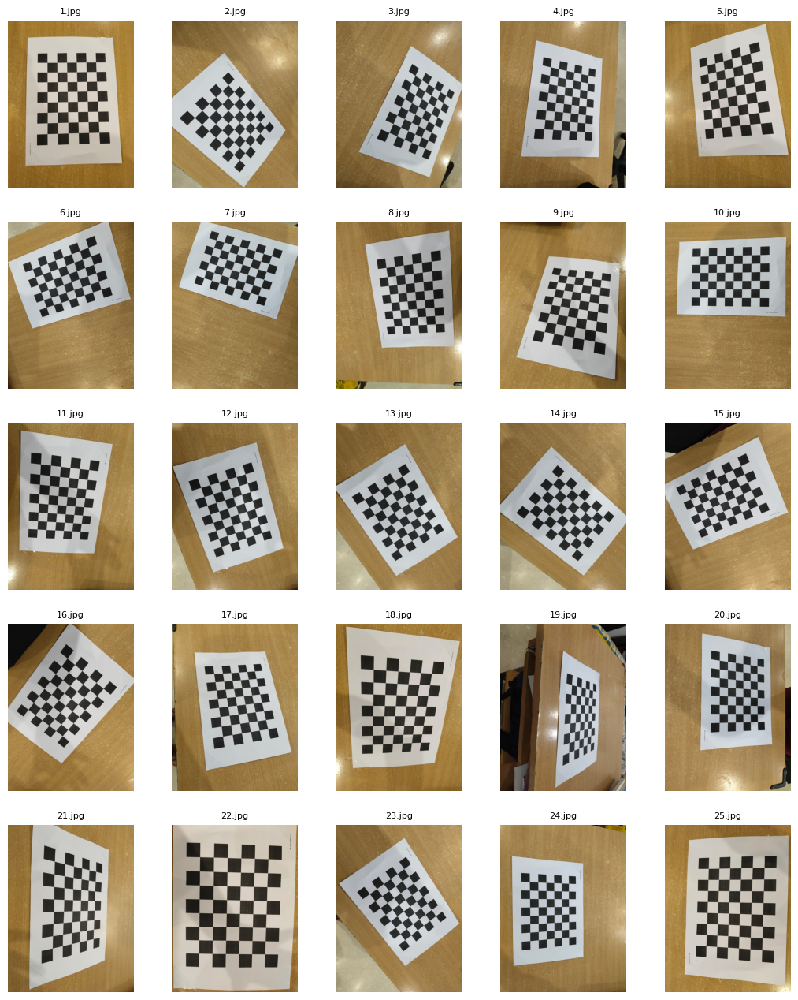

In [259]:
image_paths = [os.path.join('custom_dataset', f'{idx}.jpg') for idx in range(1, 26)]
images = [cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB) for img_path in image_paths]

plt.figure(figsize=(13, 16))

for i in range(len(images)):
    plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(image_paths[i].split('\\')[-1], fontsize=8)
    plt.axis("off")

plt.show()

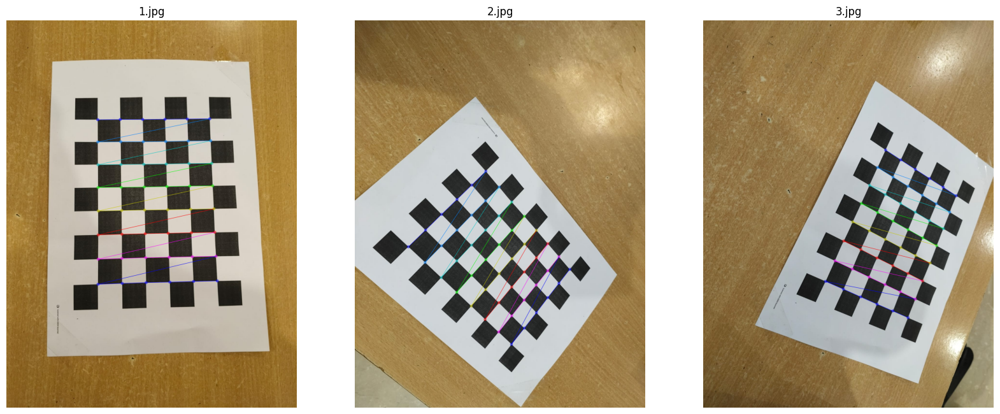

In [260]:
objpoints, imgpoints = get_points(images, image_paths, CHECKERBOARD=(6,8))
h, w = images[0].shape[:2]

plt.figure(figsize=(20, 10))
for idx in range(3):
    plt.subplot(1, 3, idx + 1)
    plt.title(image_paths[idx].split("\\")[-1])
    plt.imshow(images[idx])
    plt.axis("off")
plt.show()

In [261]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (w, h), None, None)
assert ret, "Calibration failed"
print("CAMERA MATRIX:\n", mtx)

CAMERA MATRIX:
 [[1.21808894e+03 0.00000000e+00 5.91512612e+02]
 [0.00000000e+00 1.23255539e+03 8.03969607e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [262]:
get_intrinsic(mtx)

{'focal_length': [1218.088941376052, 1232.5553902758186],
 'skew': 0.0,
 'principal_point': [591.5126121445984, 803.9696071714228]}

In [263]:
get_extrinsic(image_paths, rvecs, tvecs)

[{'image_id': '1.jpg',
  'rotation_matrix': [[0.9991404661804352,
    0.022309711615486727,
    -0.0349371665762495],
   [-0.0186174696148884, 0.9945427229507751, 0.10265555051138997],
   [0.03703672050656612, -0.10191687295679577, 0.994103230223515]],
  'translation_vector': [-2.303793648005554,
   -4.14981537176184,
   13.063347505560074]},
 {'image_id': '2.jpg',
  'rotation_matrix': [[0.658614824863372,
    0.6494431192715758,
    -0.3800659775631013],
   [-0.6983714392164676, 0.7156241143895954, 0.012627738943578645],
   [0.28018537677207506, 0.25711040767521126, 0.9248731766616314]],
  'translation_vector': [-3.8881303633537163,
   1.3852864773544284,
   13.076586145202226]}]

In [264]:
get_radial_distortion(dist)

[0.16557763823987956, -0.9570989192419161, 1.9679548757448964]

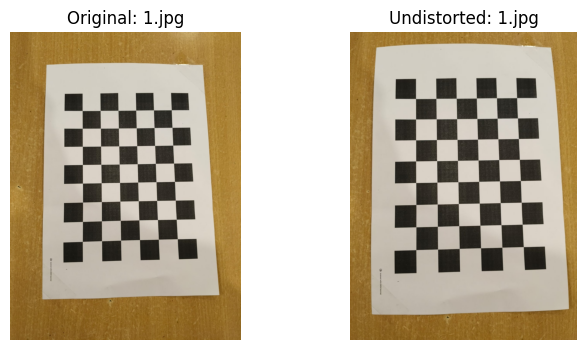

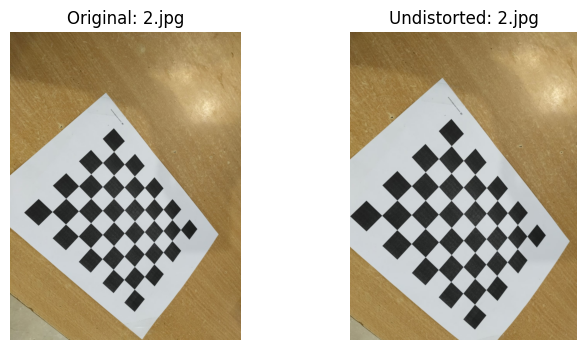

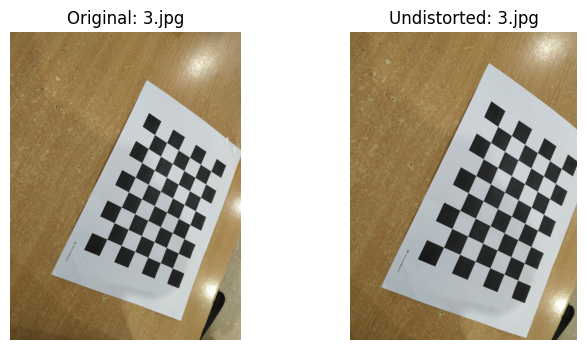

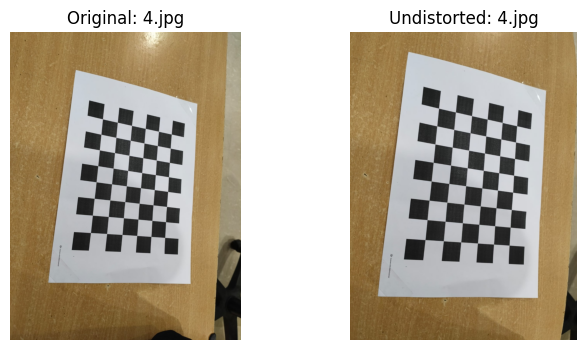

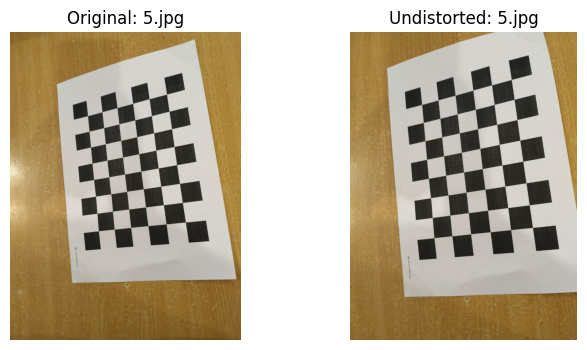

In [265]:
display_undistorted_images(image_paths, mtx, dist)

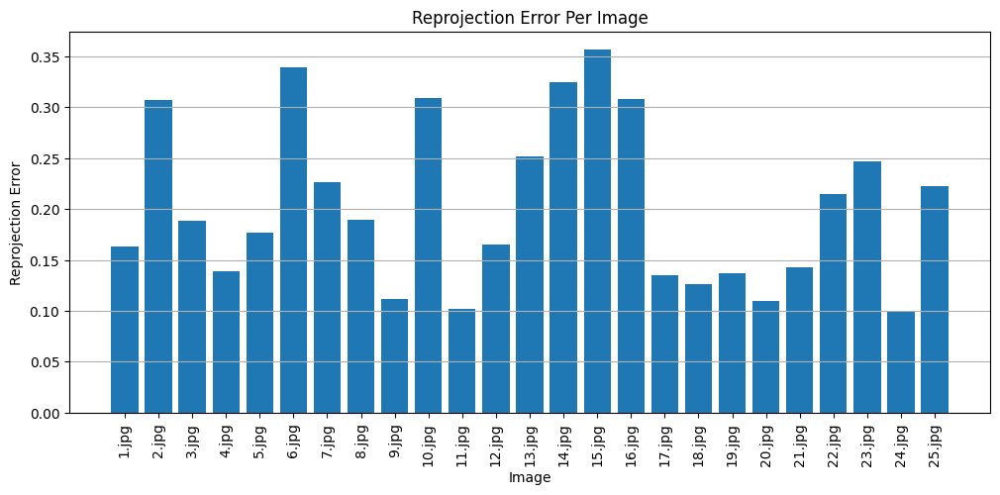

Mean Reprojection Error: 0.20372834975337686
Standard Deviation of Reprojection Error: 0.07989108265412283


In [266]:
errors, corners, projections = get_errors(image_paths, objpoints, imgpoints, rvecs, tvecs, mtx, dist)
mean, std = np.mean(errors), np.std(errors)
print("Mean Reprojection Error:", mean)
print("Standard Deviation of Reprojection Error:", std)

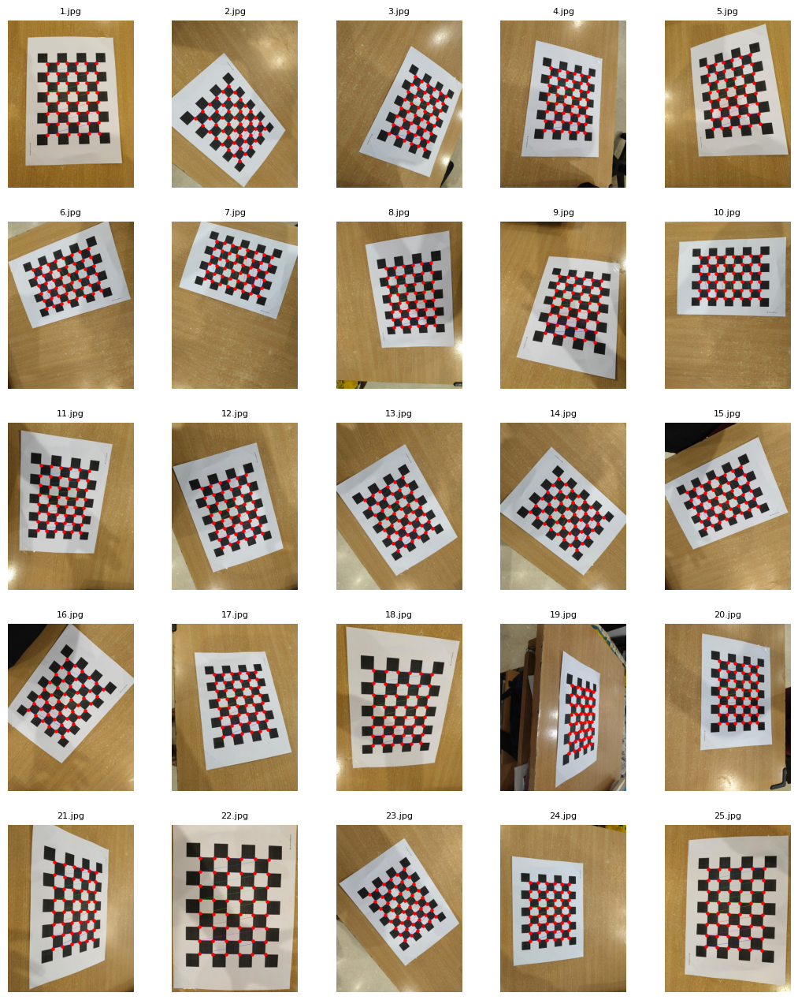

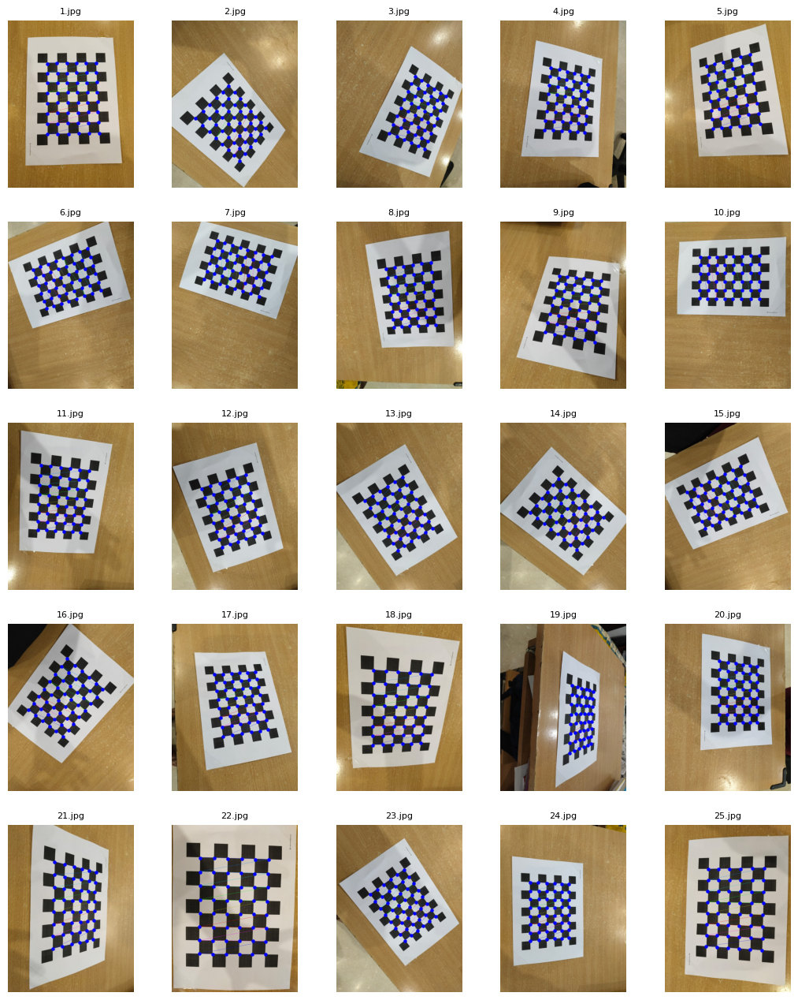

In [267]:
plot_points(image_paths, images, corners, 'red')
plot_points(image_paths, images, projections, 'blue')

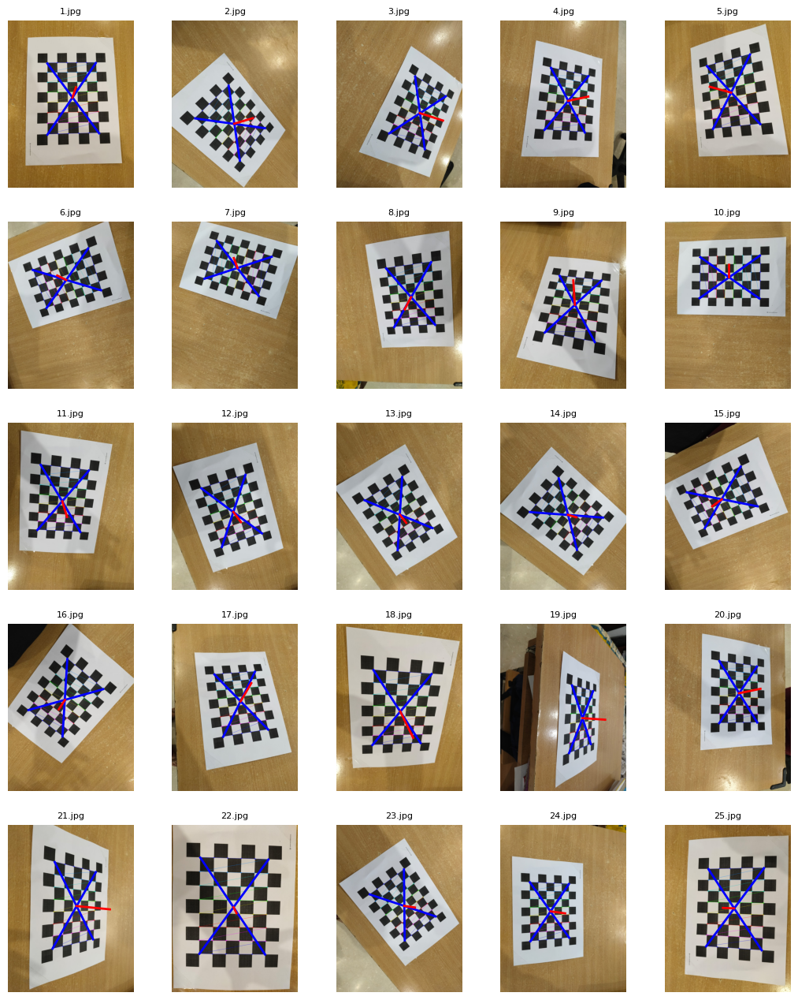

In [268]:
normals = get_normals(image_paths, images, objpoints, corners, rvecs, tvecs, mtx, dist)

In [269]:
print("Normals for Images:")
for i, image_path in enumerate(image_paths):
    print(f"{image_path.split('\\')[-1]}: {normals[i]}")

Normals for Images:
1.jpg: [-0.03493717  0.10265555  0.99410323]
2.jpg: [-0.38006598  0.01262774  0.92487318]
3.jpg: [-0.3689578  -0.01635891  0.92930217]
4.jpg: [-0.33909765  0.08416223  0.93697892]
5.jpg: [0.34281497 0.07719612 0.93622575]
6.jpg: [ 0.11523487 -0.12266638  0.9857352 ]
7.jpg: [0.06208322 0.06961607 0.99564013]
8.jpg: [ 0.16354056 -0.22216268  0.96119625]
9.jpg: [0.10505494 0.40885    0.90653469]
10.jpg: [0.09562612 0.07665679 0.99246128]
11.jpg: [-0.11246314 -0.25559996  0.96021909]
12.jpg: [-0.09936324 -0.1536228   0.98312104]
13.jpg: [-0.06733423 -0.12753634  0.98954564]
14.jpg: [-0.10807829 -0.05883326  0.99239999]
15.jpg: [ 0.04936391 -0.23613063  0.97046666]
16.jpg: [ 0.0139471  -0.1967244   0.98035962]
17.jpg: [-0.1761637   0.26303843  0.94856583]
18.jpg: [-0.18059222 -0.3431295   0.92176385]
19.jpg: [-0.77980811 -0.03503633  0.62503742]
20.jpg: [-0.34647562  0.03478541  0.93741379]
21.jpg: [-0.61709695 -0.05920324  0.78465682]
22.jpg: [-0.02746477 -0.05666531  0